In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

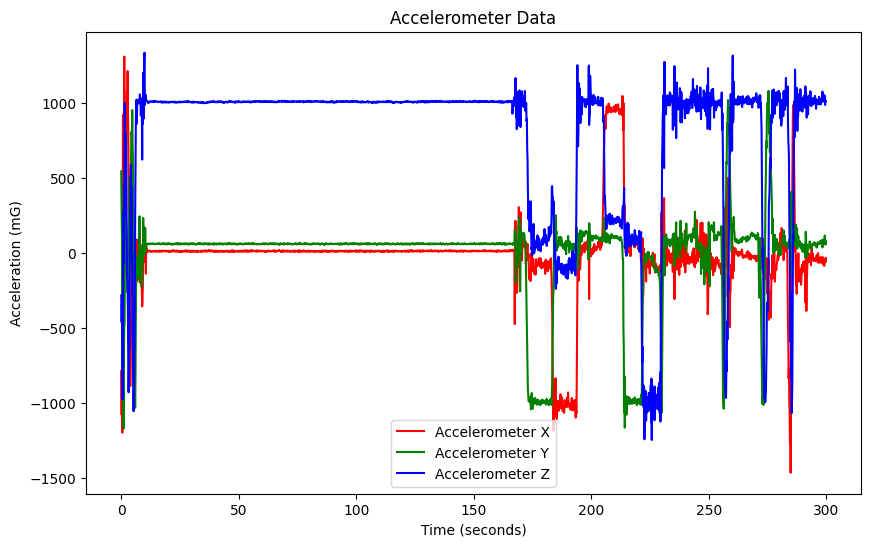

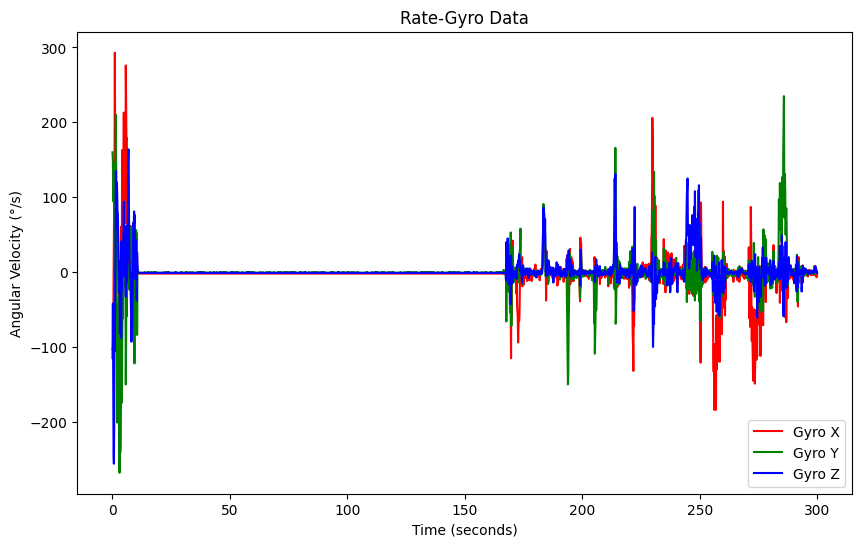

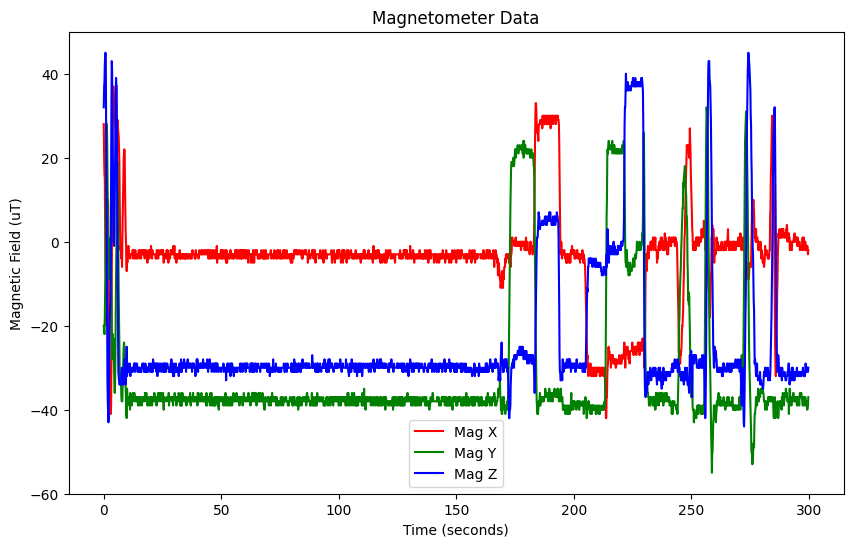

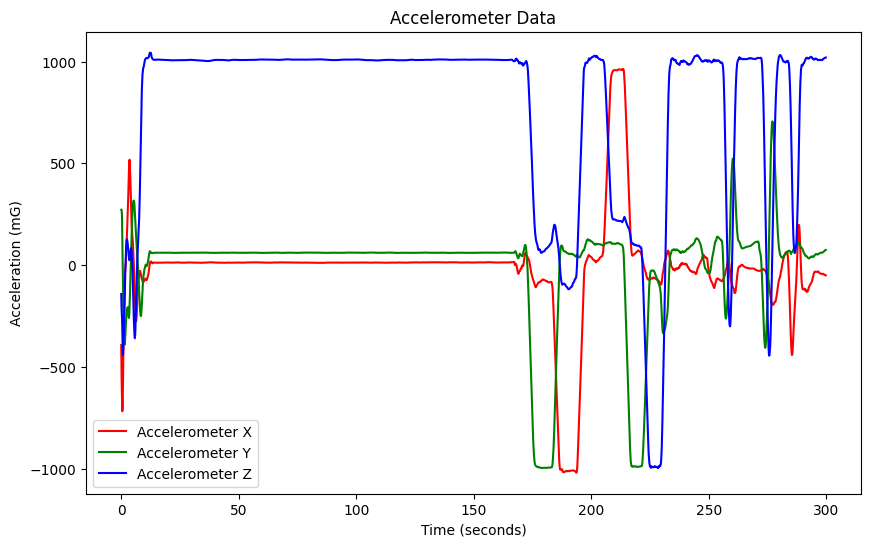

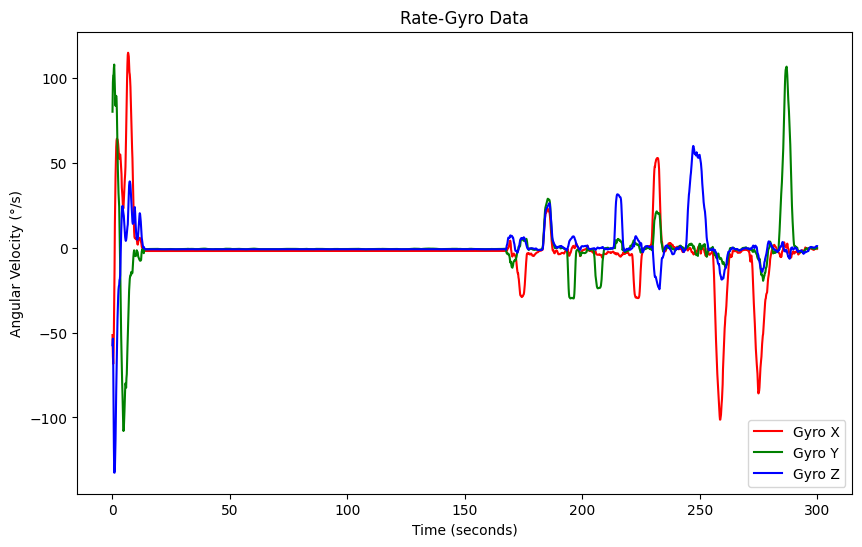

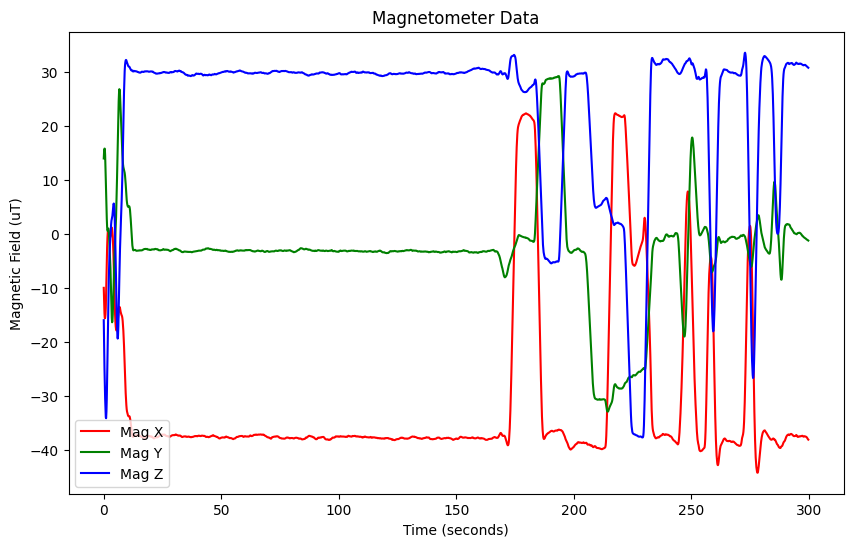

In [14]:
# Load the data (replace 'datafile.txt' with the actual filename)
data = pd.read_csv('dados/teste_estatico_com_video_2min_de_movimento.txt', sep=r'\s+', header=None, names=['time', 'a_data_1', 'a_data_2', 'a_data_3',  'w_data_1', 'w_data_2', 'w_data_3', 'mag_1', 'mag_2', 'mag_3'])

# Convert time from microseconds to seconds
data['time_seconds'] = data['time'] / 1_000_000

# Plot accelerometer data
plt.figure(figsize=(10, 6))
plt.plot(data['time_seconds'], data['a_data_1'], label='Accelerometer X', color='r')
plt.plot(data['time_seconds'], data['a_data_2'], label='Accelerometer Y', color='g')
plt.plot(data['time_seconds'], data['a_data_3'], label='Accelerometer Z', color='b')
plt.title('Accelerometer Data')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration (mG)')
plt.legend()

# Plot rate-gyro data
plt.figure(figsize=(10, 6))
plt.plot(data['time_seconds'], data['w_data_1'], label='Gyro X', color='r')
plt.plot(data['time_seconds'], data['w_data_2'], label='Gyro Y', color='g')
plt.plot(data['time_seconds'], data['w_data_3'], label='Gyro Z', color='b')
plt.title('Rate-Gyro Data')
plt.xlabel('Time (seconds)')
plt.ylabel('Angular Velocity (°/s)')
plt.legend()


# Plot magnetometer data
plt.figure(figsize=(10, 6))
plt.plot(data['time_seconds'], data['mag_1'], label='Mag X', color='r')
plt.plot(data['time_seconds'], data['mag_2'], label='Mag Y', color='g')
plt.plot(data['time_seconds'], data['mag_3'], label='Mag Z', color='b')
plt.title('Magnetometer Data')
plt.xlabel('Time (seconds)')
plt.ylabel('Magnetic Field (uT)')
plt.legend()

plt.show()

# Load the data (replace 'datafile.txt' with the actual filename)
data = pd.read_csv('filtered_data.txt', sep=r'\s+', header=None, names=['time', 'a_data_1', 'a_data_2', 'a_data_3',  'w_data_1', 'w_data_2', 'w_data_3', 'mag_1', 'mag_2', 'mag_3'])

# Convert time from microseconds to seconds
data['time_seconds'] = data['time'] / 1_000_000

# Plot accelerometer data
plt.figure(figsize=(10, 6))
plt.plot(data['time_seconds'], data['a_data_1'], label='Accelerometer X', color='r')
plt.plot(data['time_seconds'], data['a_data_2'], label='Accelerometer Y', color='g')
plt.plot(data['time_seconds'], data['a_data_3'], label='Accelerometer Z', color='b')
plt.title('Accelerometer Data')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration (mG)')
plt.legend()

# Plot rate-gyro data
plt.figure(figsize=(10, 6))
plt.plot(data['time_seconds'], data['w_data_1'], label='Gyro X', color='r')
plt.plot(data['time_seconds'], data['w_data_2'], label='Gyro Y', color='g')
plt.plot(data['time_seconds'], data['w_data_3'], label='Gyro Z', color='b')
plt.title('Rate-Gyro Data')
plt.xlabel('Time (seconds)')
plt.ylabel('Angular Velocity (°/s)')
plt.legend()

# Plot magnetometer data
plt.figure(figsize=(10, 6))
plt.plot(data['time_seconds'], data['mag_1'], label='Mag X', color='r')
plt.plot(data['time_seconds'], data['mag_2'], label='Mag Y', color='g')
plt.plot(data['time_seconds'], data['mag_3'], label='Mag Z', color='b')
plt.title('Magnetometer Data')
plt.xlabel('Time (seconds)')
plt.ylabel('Magnetic Field (uT)')
plt.legend()

plt.show()

# Plot orientation frames


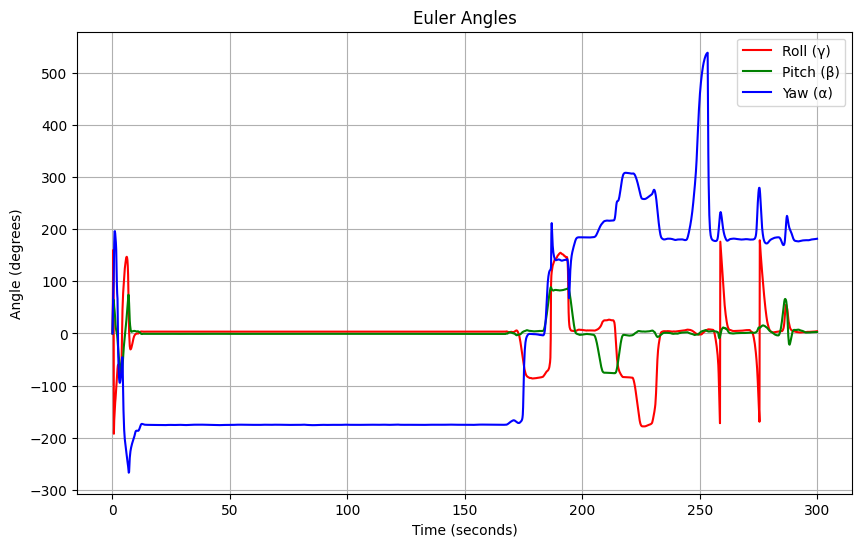

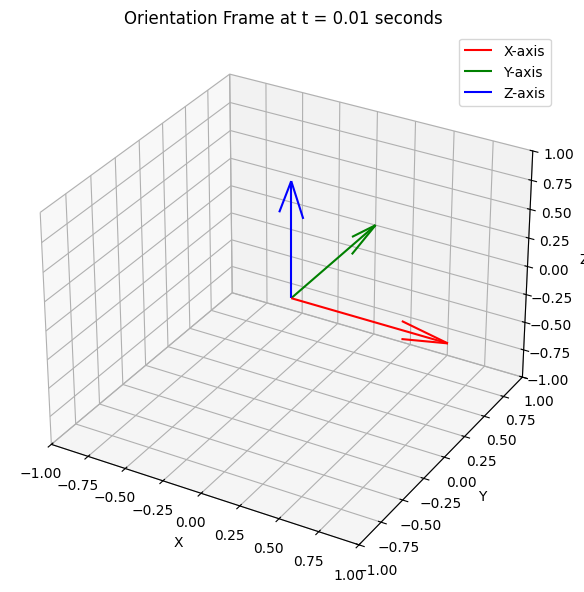

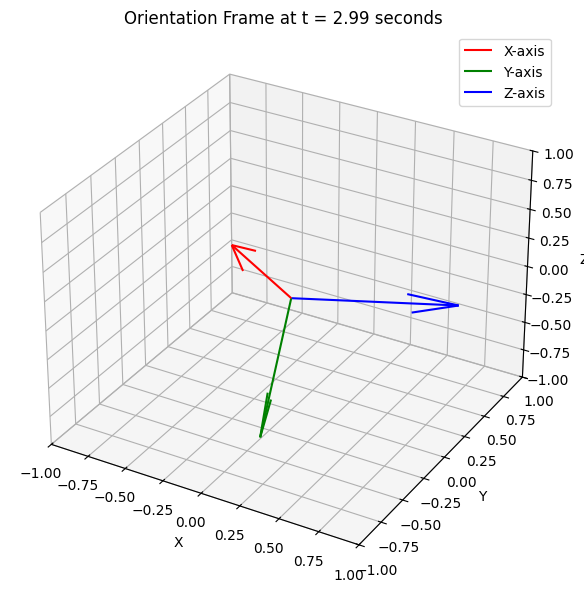

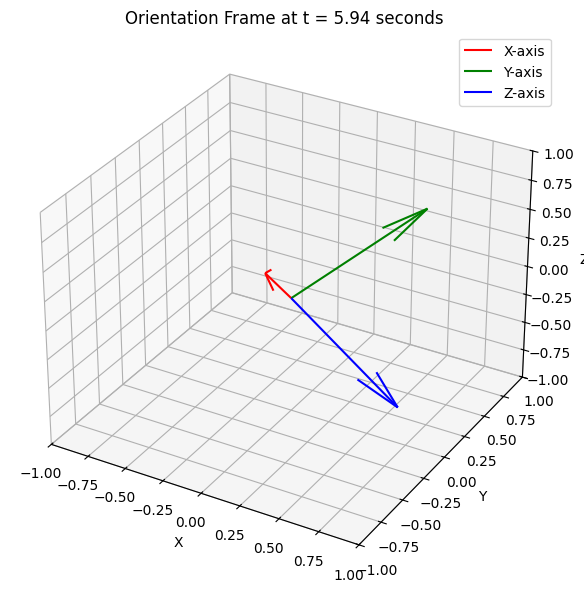

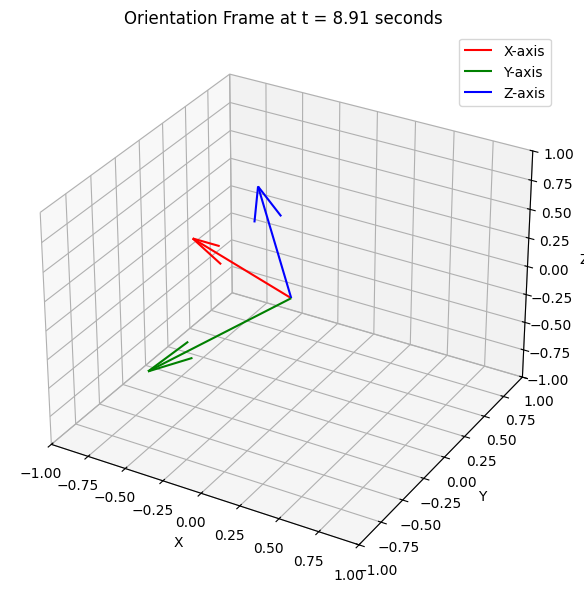

...

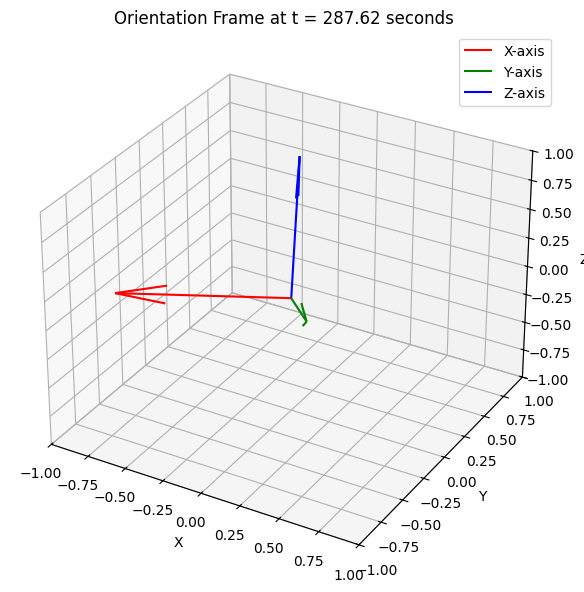

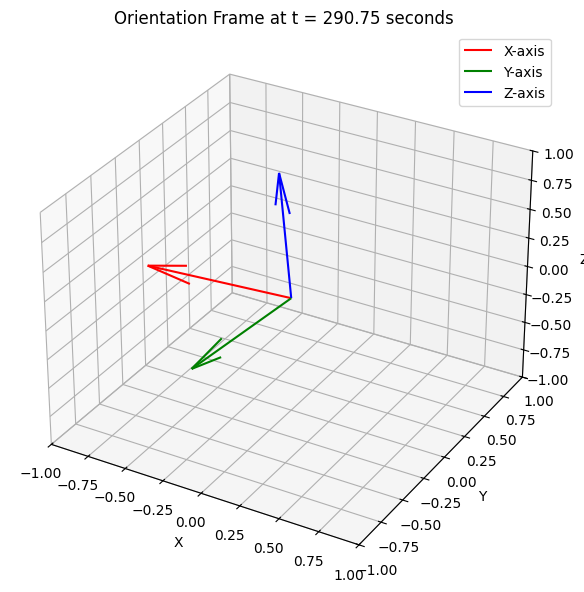

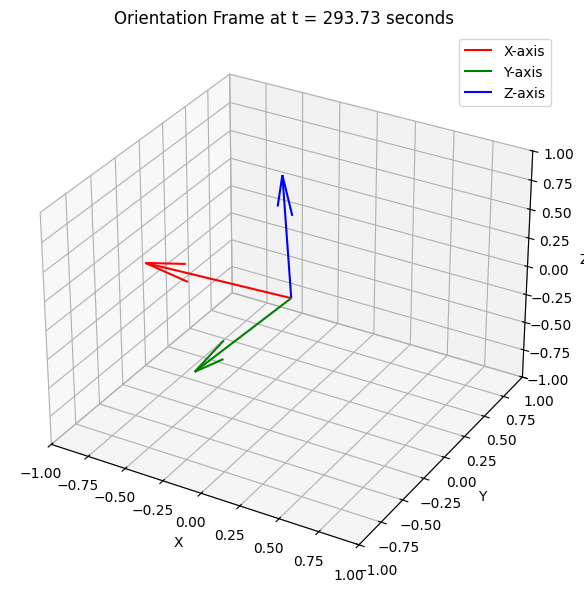

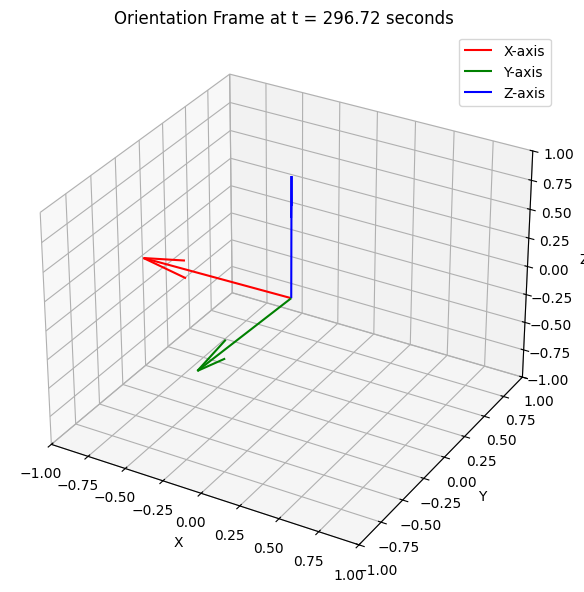

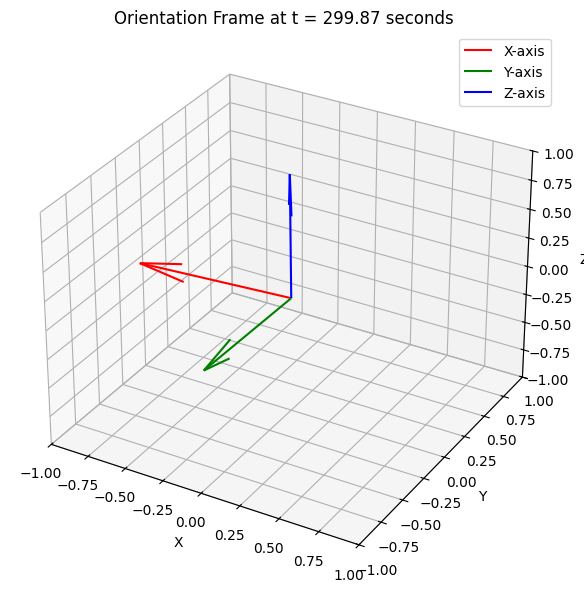

In [15]:
# Load data from the file
data = np.loadtxt('orientation_data.txt')

# Extract time, roll, pitch, and yaw
time = data[:, 0] / 1e6  # Convert time from microseconds to seconds
roll = data[:, 1]
pitch = data[:, 2]
yaw = data[:, 3]

# Convert to arrays
roll = np.array(roll)
pitch = np.array(pitch)
yaw = np.array(yaw)

# Plot Euler angles over time
plt.figure(figsize=(10, 6))
plt.plot(time, roll, label='Roll (γ)', color='r')
plt.plot(time, pitch, label='Pitch (β)', color='g')
plt.plot(time, yaw, label='Yaw (α)', color='b')
plt.title('Euler Angles')
plt.xlabel('Time (seconds)')
plt.ylabel('Angle (degrees)')
plt.legend()
plt.grid()
plt.show()

# Updated function to plot orientation frames
def plot_orientation_frames_separately(roll, yaw, pitch, time, num_frames=100):
    """
    Plot 3D orientation frames in separate figures, labeled by timestamps.

    Parameters:
    - roll: Array of roll angles (radians)
    - pitch: Array of pitch angles (radians)
    - yaw: Array of yaw angles (radians)
    - time: Array of time points (seconds)
    - num_frames: Number of frames to plot
    """
    # Select evenly spaced time indices for visualization
    frame_indices = np.linspace(0, len(roll) - 1, num_frames, dtype=int)

    # Iterate over selected frames
    for idx in frame_indices:
        # Get roll, pitch, and time at the current frame
        gamma = np.radians(roll[idx])
        alpha = np.radians(yaw[idx])
        beta = np.radians(pitch[idx])
        timestamp = time[idx]

        # Rotation matrices
        Rz = np.array([
            [np.cos(alpha), -np.sin(alpha), 0],
            [np.sin(alpha),  np.cos(alpha), 0],
            [0,              0,             1]
        ])
        Ry = np.array([
            [np.cos(beta), 0, np.sin(beta)],
            [0,            1, 0],
            [-np.sin(beta), 0, np.cos(beta)]
        ])
        Rx = np.array([
            [1, 0,              0],
            [0, np.cos(gamma), -np.sin(gamma)],
            [0, np.sin(gamma),  np.cos(gamma)]
        ])

        # Combined rotation matrix
        R = Rz @ Ry @ Rx

        # Define local frame axes
        frame_length = 1.0  # Length of the frame axes
        x_axis = R @ [frame_length, 0, 0]
        y_axis = R @ [0, frame_length, 0]
        z_axis = R @ [0, 0, frame_length]

        # Create a 3D figure for the current timestamp
        fig = plt.figure(figsize=(8, 6))
        ax = fig.add_subplot(111, projection='3d')

        # Plot the local frame
        ax.quiver(0, 0, 0, x_axis[0], x_axis[1], x_axis[2], color='r', label='X-axis')
        ax.quiver(0, 0, 0, y_axis[0], y_axis[1], y_axis[2], color='g', label='Y-axis')
        ax.quiver(0, 0, 0, z_axis[0], z_axis[1], z_axis[2], color='b', label='Z-axis')

        # Set plot limits for better visualization
        ax.set_xlim([-1, 1])
        ax.set_ylim([-1, 1])
        ax.set_zlim([-1, 1])

        # Set labels, title, and legend
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title(f'Orientation Frame at t = {timestamp:.2f} seconds')
        ax.legend()

        # Show the current figure
        plt.tight_layout()
        plt.show()

# Call the updated function
plot_orientation_frames_separately(roll, yaw, pitch, time, num_frames=100)


# Task 5


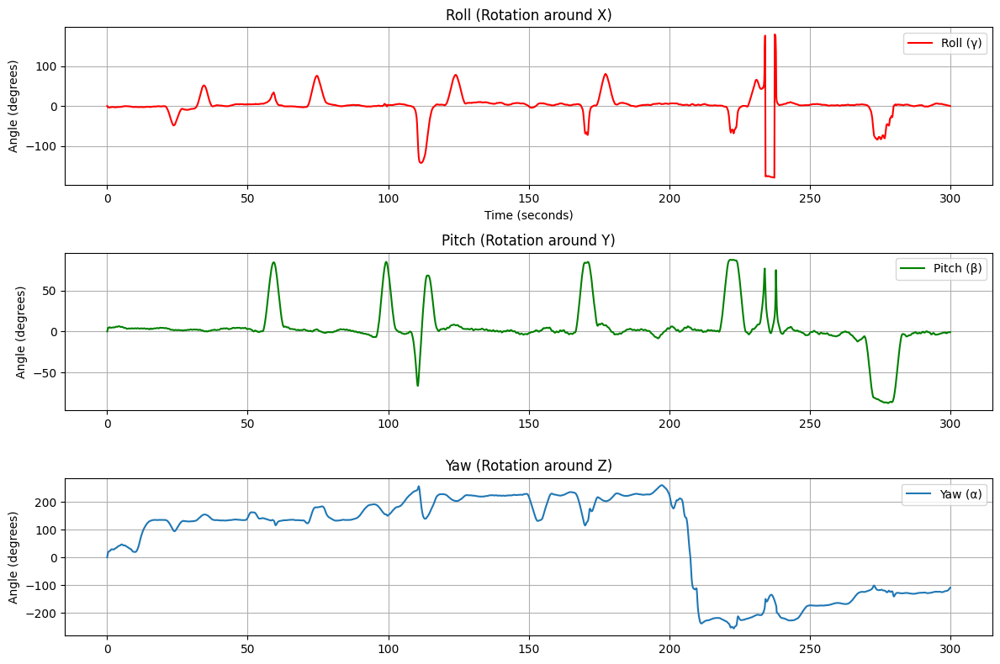

In [12]:
def plot_orientation_trajectory(time, alpha, beta, gamma):
    """
    Plot the orientation trajectory in Euler angles
    """
    plt.figure(figsize=(12, 8))
    
    plt.subplot(3, 1, 3)
    plt.plot(time, alpha, label='Yaw (α)')
    plt.title('Yaw (Rotation around Z)')
    plt.ylabel('Angle (degrees)')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(3, 1, 2)
    plt.plot(time, beta, label='Pitch (β)', color='green')
    plt.title('Pitch (Rotation around Y)')
    plt.ylabel('Angle (degrees)')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(3, 1, 1)
    plt.plot(time, gamma, label='Roll (γ)', color='red')
    plt.title('Roll (Rotation around X)')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Angle (degrees)')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

plot_orientation_trajectory(time, yaw, pitch, roll)

### Este código foi usado no paper sobre sensor fusion